In [7]:
#from ultralytics import YOLOWorld
from PIL import Image
import matplotlib.pyplot as plt
import os
import pandas as pd
from collections import defaultdict
#from geopy.distance import geodesic
import math
#import osmnx as ox
#import cv2
import json
from sklearn.model_selection import train_test_split
import os
import torch
import pandas as pd
from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM

/hpi/fs00/home/liudvikas.zekas/miniconda3/envs/lmms-finetune/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
model = YOLOWorld('yolov8x-worldv2.pt')

In [3]:
train_df = pd.read_csv('./G340890_50m_panoid.csv')

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split
import os

In [5]:

# Define the base folder and orientations
base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"
orientations = ["front", "back", "left", "right"]

def check_missing_images(base_folder, train_df, orientations):
    missing_counts = defaultdict(int)  # Dictionary to store missing counts for each orientation
    missing_details = []  # List to store details of missing files for debugging

    for panoid in train_df["panoid"]:
        # Create subfolder path based on `0/0/4` structure
        subfolder = os.path.join(base_folder, panoid[0], panoid[1], panoid[2])
        for orientation in orientations:
            filename = f"{panoid}_{orientation}.webp"  # Construct the filename
            filepath = os.path.join(subfolder, filename)
            if not os.path.exists(filepath):
                missing_counts[orientation] += 1
                missing_details.append({"panoid": panoid, "orientation": orientation})
    
    return missing_counts, missing_details

# Execute the function
#missing_counts, missing_details = check_missing_images(base_folder, train_df, orientations)

# Print results
print("Accumulated Missing Counts by Orientation:")
#for orientation, count in missing_counts.items():
#    print(f"{orientation}: {count}")

print("\nDetails of Missing Files:")
#for detail in missing_details:
#    print(detail)

Accumulated Missing Counts by Orientation:

Details of Missing Files:


In [6]:
# Define the bounding box or location
place_name = "New York City, USA"
tags = {'amenity': ['post_box', 'bench', 'bus_station', 'waste_basket', 'charging_station', 'fuel', 'atm', 'telephone', 'waste_disposal', 'recycling', 'vending_machine']}  # Fetch all amenities


gdf = ox.features_from_place(place_name, tags)

# Extract latitude and longitude from the geometries
gdf['latitude'] = gdf.geometry.centroid.y
gdf['longitude'] = gdf.geometry.centroid.x

amenities_lat_lon_df = gdf[['amenity', 'latitude', 'longitude']]
print(amenities_lat_lon_df)

                           amenity   latitude  longitude
element id                                              
node    42538083             bench  40.673352 -73.970702
        357618584         post_box  40.682496 -73.962688
        357618608         post_box  40.643833 -73.979460
        368043710            bench  40.748034 -73.982649
        368047025         post_box  40.680693 -74.006422
...                            ...        ...        ...
way     1319909119           bench  40.720343 -74.010985
        1319909120           bench  40.720334 -74.010894
        1319909121           bench  40.720327 -74.010823
        1337088238  waste_disposal  40.734584 -73.738718
        1351901322     bus_station  40.662041 -73.830327

[25794 rows x 3 columns]


/tmp/ipykernel_654619/3118428048.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['latitude'] = gdf.geometry.centroid.y
/tmp/ipykernel_654619/3118428048.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['longitude'] = gdf.geometry.centroid.x


In [8]:
# List of amenities to count
amenities_of_interest = [
    'post_box', 
    'bench', 
    'bus_station', 
    'waste_basket', 
    'charging_station',
    'atm', 
    'telephone', 
    'waste_disposal', 
    'recycling', 
    'vending_machine'
]
common_amenities = [
    "building",
    "house",
    "apartment complex",
    "car",
    "truck",
    "bus",
    "bicycle",
    "motorcycle",
    "pedestrian",
    "traffic light",
    "traffic sign",
    "stop sign",
    "street lamp",
    "fire hydrant",
    "tree",
    "shrub",
    "sidewalk",
    "road",
    "fence",
    "mailbox",
    "bench",
    "trash can",
    "parking meter",
    "pole",
    "bus stop"
]
amenities_map = {
    "post_box": "post box",
    "bench": "bench",
    "bus_station": "bus station",
    "waste_basket": "trash bin",
    "fuel": "gas station",
    "charging_station": "electric charging station",
    "atm": "atm",
    "telephone": "payphone",
    "waste_disposal": "large waste dumpster",
    "recycling": "recycling bin",
    "vending_machine": "vending machine"
}

In [8]:
result_list = []

# Define approximate degree deltas for ~30 meters:
# Latitude: ~111 km per degree, so 30 m ~ 0.00027 degrees
lat_delta = 0.0003  # A slightly larger buffer than 0.00027 for safety

# We'll dynamically compute longitude delta to be safe:
# longitude degrees change with latitude, so we compute for each point.
def get_lon_delta(lat):
    return 0.0003 / math.cos(math.radians(lat))

for index, row in train_df.iterrows():
    pic_lat = row['lat']
    pic_lon = row['lon']

    # Compute bounding box around the picture
    lon_delta = get_lon_delta(pic_lat)
    lat_min = pic_lat - lat_delta
    lat_max = pic_lat + lat_delta
    lon_min = pic_lon - lon_delta
    lon_max = pic_lon + lon_delta

    # Filter amenities by bounding box
    subset = amenities_lat_lon_df[
        (amenities_lat_lon_df['latitude'] >= lat_min) &
        (amenities_lat_lon_df['latitude'] <= lat_max) &
        (amenities_lat_lon_df['longitude'] >= lon_min) &
        (amenities_lat_lon_df['longitude'] <= lon_max)
    ]
    
    # Now compute geodesic distance on this filtered subset
    pic_coords = (pic_lat, pic_lon)
    amenities_in_radius = []
    for _, amenity_row in subset.iterrows():
        amenity_coords = (amenity_row['latitude'], amenity_row['longitude'])
        dist = geodesic(pic_coords, amenity_coords).meters
        if dist <= 30:
            amenities_in_radius.append({
                'amenity': amenity_row['amenity'],
                'latitude': amenity_row['latitude'],
                'longitude': amenity_row['longitude']
            })
    if amenities_in_radius:
        result_list.append({
            'id': row['panoid'],
            'latitude': pic_lat,
            'longitude': pic_lon,
            'amenities': amenities_in_radius
        })

final_df = pd.DataFrame(result_list)
print(final_df)


                          id   latitude  longitude  \
0     005FEssqWDoX8qyMsk-7ig  40.854582 -73.854778   
1     01bbe2LGUVmiDFwlXk9sTQ  40.877764 -73.867587   
2     01Iomneot1J3cXx40bl6Vg  40.848541 -73.861590   
3     02R4NApdqGF40vkBwRToQQ  40.852314 -73.828548   
4     031mgln_oXW2-af2X2mbLg  40.847030 -73.901281   
...                      ...        ...        ...   
6634  zZi2lBkPXZFgP1sFXwj3HA  40.849253 -73.830131   
6635  ZZr4Y5BDYB-RJBH8HxOThA  40.851055 -73.848582   
6636  zZxGvpAG-ZwisDJdU2lB7w  40.901825 -73.901800   
6637  Zzzd7SlkckA2OBiXjWoODw  40.904114 -73.904754   
6638  zzZWC00CmqJRK_hJj9UX7g  40.843283 -73.870002   

                                              amenities  
0     [{'amenity': 'fuel', 'latitude': 40.8543184, '...  
1     [{'amenity': 'fuel', 'latitude': 40.8779673, '...  
2     [{'amenity': 'post_box', 'latitude': 40.848399...  
3     [{'amenity': 'post_box', 'latitude': 40.852180...  
4     [{'amenity': 'fuel', 'latitude': 40.8469533996...  
...

In [9]:
distance_results = []


for _, row in final_df.iterrows():
    # Get the ID point coordinates
    id_coords = (row['latitude'], row['longitude'])
    
    amenities_with_distances = []
    
    # iterate over the amenities for this id
    for amenity in row['amenities']:
        amenity_coords = (amenity['latitude'], amenity['longitude'])
        distance = geodesic(id_coords, amenity_coords).meters 
        
        amenities_with_distances.append({
            'amenity': amenity['amenity'],
            'latitude': amenity['latitude'],
            'longitude': amenity['longitude'],
            'distance_from_id': distance
        })
    
    distance_results.append({
        'latitude': row['latitude'],
        'longitude': row['longitude'],
        'id': row['id'],
        'amenities': amenities_with_distances
    })

final_with_distances_df = pd.DataFrame(distance_results)
print(final_with_distances_df)


       latitude  longitude                      id  \
0     40.854582 -73.854778  005FEssqWDoX8qyMsk-7ig   
1     40.877764 -73.867587  01bbe2LGUVmiDFwlXk9sTQ   
2     40.848541 -73.861590  01Iomneot1J3cXx40bl6Vg   
3     40.852314 -73.828548  02R4NApdqGF40vkBwRToQQ   
4     40.847030 -73.901281  031mgln_oXW2-af2X2mbLg   
...         ...        ...                     ...   
6634  40.849253 -73.830131  zZi2lBkPXZFgP1sFXwj3HA   
6635  40.851055 -73.848582  ZZr4Y5BDYB-RJBH8HxOThA   
6636  40.901825 -73.901800  zZxGvpAG-ZwisDJdU2lB7w   
6637  40.904114 -73.904754  Zzzd7SlkckA2OBiXjWoODw   
6638  40.843283 -73.870002  zzZWC00CmqJRK_hJj9UX7g   

                                              amenities  
0     [{'amenity': 'fuel', 'latitude': 40.8543184, '...  
1     [{'amenity': 'fuel', 'latitude': 40.8779673, '...  
2     [{'amenity': 'post_box', 'latitude': 40.848399...  
3     [{'amenity': 'post_box', 'latitude': 40.852180...  
4     [{'amenity': 'fuel', 'latitude': 40.8469533996...  
...

In [19]:
final_with_distances_df.to_csv('amenities_near_30.csv', index=False)

In [12]:
from enum import Enum
import random

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image, ImageDraw, ImageFont

# constants
colormap = ['blue','orange','green','purple','brown','pink','gray','olive','cyan','red',
            'lime','indigo','violet','aqua','magenta','coral','gold','tan','skyblue']

# to be set
model = None
processor = None

def set_model_info(model_, processor_):
    global model, processor
    model = model_
    processor = processor_


class TaskType(str, Enum):
    """ The types of tasks Florence-2 supports """

    ########################## NO ADDITIONAL INPUT ############################
    # Whole image to natural language
    CAPTION = '<CAPTION>'
    """Image level brief caption"""
    DETAILED_CAPTION = '<DETAILED_CAPTION>'
    """Image level detailed caption"""
    MORE_DETAILED_CAPTION = '<MORE_DETAILED_CAPTION>'
    """Image level very detailed caption"""

    # Whole image to text( + region)
    OCR = '<OCR>'
    """ OCR for entire image """
    OCR_WITH_REGION = '<OCR_WITH_REGION>'
    """ OCR for entire image, with bounding boxes for individual text items """

    # Whole image to regions (+ categories or natural language)
    REGION_PROPOSAL = '<REGION_PROPOSAL>'
    """Proposes bounding boxes for salient objects (no labels)"""
    OBJECT_DETECTION = '<OD>'
    """Identifies objects via bounding boxes and gives categorical labels"""
    DENSE_REGION_CAPTION = '<DENSE_REGION_CAPTION>'
    """Identifies objects via bounding boxes and gives natural language labels"""

    ############################# REGION INPUT #################################
    # Region to segment
    REG_TO_SEG = '<REGION_TO_SEGMENTATION>'
    """Segments salient object in a given region"""

    # Region to text
    REGION_TO_CATEGORY = '<REGION_TO_CATEGORY>'
    """ get object classification for bounding box """
    REGION_TO_DESCRIPTION = '<REGION_TO_DESCRIPTION>'
    """ get natural language description for contents of bounding box """

    ######################### NATURAL LANGUAGE INPUT ###########################
    # Natural language to regions (1 to many)
    PHRASE_GROUNDING = '<CAPTION_TO_PHRASE_GROUNDING>'
    """Given a caption, provides bounding boxes to visually ground phrases in the caption"""

    # Natural language to region (1 to 1?)
    OPEN_VOCAB_DETECTION = '<OPEN_VOCABULARY_DETECTION>'
    """Detect bounding box for objects and OCR text"""
    
    # Natural language to segment (1 to 1?)
    RES = '<REFERRING_EXPRESSION_SEGMENTATION>'
    """Referring Expression Segmentation - given a natural language descriptor
    identifies the segmented region that corresponds
    """
    

# prediction function
def run_example(task_prompt: TaskType, image, text_input=None):
    # Make sure task is a supported task
    if not isinstance(task_prompt, TaskType):
      raise ValueError(f"""
      task_prompt must be a TaskType, but {task_prompt} is of type {type(task_prompt)})
      """)

    # some prompt types do not require inputs
    if text_input is None:
        prompt = task_prompt.value
    else:
        prompt = task_prompt.value + text_input

    #
    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
      input_ids=inputs["input_ids"].cuda(),
      pixel_values=inputs["pixel_values"].cuda(),
      max_new_tokens=1024,
      early_stopping=False,
      do_sample=False,
      num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt.value,
        image_size=(image.width, image.height)
    )

    return parsed_answer


def plot_bbox(data, image):
    """given an image and a dictionary of bounding boxes, 
    plot the bounding boxes on the image"""

   # Create a figure and axes
    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(image)

    # Plot each bounding box
    for bbox, label in zip(data['bboxes'], data['labels']):
        # Unpack the bounding box coordinates
        x1, y1, x2, y2 = bbox
        # Create a Rectangle patch
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
        # Add the rectangle to the Axes
        ax.add_patch(rect)
        # Annotate the label
        plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

    # Remove the axis ticks and labels
    ax.axis('off')

    # Show the plot
    plt.show()


def draw_polygons(image, prediction, fill_mask=False):
    """
    Draws segmentation masks with polygons on an image.

    Parameters:
    - image_path: Path to the image file.
    - prediction: Dictionary containing 'polygons' and 'labels' keys.
                  'polygons' is a list of lists, each containing vertices of a polygon.
                  'labels' is a list of labels corresponding to each polygon.
    - fill_mask: Boolean indicating whether to fill the polygons with color.
    """
    # Load the image
    draw = ImageDraw.Draw(image)


    # Set up scale factor if needed (use 1 if not scaling)
    scale = 1

    # Iterate over polygons and labels
    for polygons, label in zip(prediction['polygons'], prediction['labels']):
        color = random.choice(colormap)
        fill_color = random.choice(colormap) if fill_mask else None

        for _polygon in polygons:
            _polygon = np.array(_polygon).reshape(-1, 2)
            if len(_polygon) < 3:
                print('Invalid polygon:', _polygon)
                continue

            _polygon = (_polygon * scale).reshape(-1).tolist()

            # Draw the polygon
            if fill_mask:
                draw.polygon(_polygon, outline=color, fill=fill_color)
            else:
                draw.polygon(_polygon, outline=color)

            # Draw the label text
            draw.text((_polygon[0] + 8, _polygon[1] + 2), label, fill=color)

    # Save or display the image
    #image.show()  # Display the image
    #display(image)
    return image


def convert_to_od_format(data):
    """
    Converts a dictionary with 'bboxes' and 'bboxes_labels' into a dictionary with separate 'bboxes' and 'labels' keys.

    Parameters:
    - data: The input dictionary with 'bboxes', 'bboxes_labels', 'polygons', and 'polygons_labels' keys.

    Returns:
    - A dictionary with 'bboxes' and 'labels' keys formatted for object detection results.
    """
    # Extract bounding boxes and labels
    bboxes = data.get('bboxes', [])
    labels = data.get('bboxes_labels', [])

    # Construct the output format
    od_results = {
        'bboxes': bboxes,
        'labels': labels
    }

    return od_results

def draw_ocr_bboxes(image, prediction):
    scale = 1
    draw = ImageDraw.Draw(image)
    bboxes, labels = prediction['quad_boxes'], prediction['labels']
    for box, label in zip(bboxes, labels):
        color = random.choice(colormap)
        new_box = (np.array(box) * scale).tolist()
        draw.polygon(new_box, width=3, outline=color)
        draw.text((new_box[0]+8, new_box[1]+2),
                    "{}".format(label),
                    align="right",

                    fill=color)
    return image


def convert_bbox_to_relative(box, image):
  """ converts bounding box pixel coordinates to relative coordinates in the
  range 0-999 """
  return [
      (box[0]/image.width)*999,
      (box[1]/image.height)*999,
      (box[2]/image.width)*999,
      (box[3]/image.height)*999,
    ]

def convert_relative_to_bbox(relative, image):
  """ converts list of relative coordinates to pixel coordinates """
  return [
      (relative[0]/999)*image.width,
      (relative[1]/999)*image.height,
      (relative[2]/999)*image.width,
      (relative[3]/999)*image.height,
    ]

def convert_relative_to_loc(relative_coordinates):
  """ converts a list of relative coordinate positions x1, y1, x2, y2 to a 
  string of position tokens """
  return ''.join([f'<loc_{i}>' for i in relative_coordinates])

def convert_bbox_to_loc(box, image):
  """ convert bounding box pixel coordinates to position tokens """
  relative_coordinates = convert_bbox_to_relative(box, image)
  return convert_relative_to_loc(relative_coordinates)



In [33]:

# Example
reverse_amenities_map = {v: k for k, v in amenities_map.items()}

# Initialize Florence-2
model_id = 'microsoft/Florence-2-large'
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True).eval().cuda()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)
set_model_info(model, processor)

task = TaskType.OPEN_VOCAB_DETECTION

base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"
orientations = ["front", "back", "left", "right"]

detection_results = []

for idx, row in final_with_distances_df.head(25).iterrows():
    image_id = row['id']

    amenity_stats = {}
    for amenity_obj in row["amenities"]:
        amen_type = amenity_obj['amenity']
        dist = amenity_obj['distance_from_id']

        if amen_type not in amenity_stats:
            amenity_stats[amen_type] = {
                "count": 0,
                "distances": []
            }
        amenity_stats[amen_type]["count"] += 1
        amenity_stats[amen_type]["distances"].append(dist)

    # Also store minimal distance
    for k, v in amenity_stats.items():
        v["min_distance"] = min(v["distances"])

    raw_amenities = list(set(a['amenity'] for a in row['amenities']))
    descriptive_amenities = [
        amenities_map[a] if a in amenities_map else a
        for a in raw_amenities
    ]

    s1, s2, s3 = image_id[0], image_id[1], image_id[2]
    folder_path = os.path.join(base_folder, s1, s2, s3)

    for orientation in orientations:
        image_filename = f"{image_id}_{orientation}.webp"
        image_path = os.path.join(folder_path, image_filename)

        if not os.path.exists(image_path):
            continue

        image_pil = Image.open(image_path).convert("RGB")

        # For each descriptive label, run open-vocab detection
        for descriptive_label in descriptive_amenities:
            results = run_example(task, image_pil, text_input=descriptive_label)
            bbox_results = convert_to_od_format(results[TaskType.OPEN_VOCAB_DETECTION])

            bboxes = bbox_results.get('bboxes', [])
            labels = bbox_results.get('labels', [])

            # If the number of labels matches the number of bounding boxes,
            # iterate over them in parallel
            for i in range(len(bboxes)):
                box = bboxes[i]
                detection_label = labels[i]  # e.g. "fuel"

                x_min, y_min, x_max, y_max = box

                # Map detection_label back to the original label name (if needed)
                original_label = reverse_amenities_map.get(detection_label, detection_label)

                # Retrieve count + min_distance
                count_in_proximity = 0
                min_distance = None
                if original_label in amenity_stats:
                    count_in_proximity = amenity_stats[original_label]["count"]
                    min_distance = amenity_stats[original_label]["min_distance"]

                # Append to detection_results
                detection_results.append({
                    'id': image_id,
                    'subfolder': f"{s1}/{s2}/{s3}",
                    'orientation': orientation,
                    'label': original_label,
                    'x_min': x_min,
                    'y_min': y_min,
                    'x_max': x_max,
                    'y_max': y_max,
                    'count_in_proximity': count_in_proximity,
                    'min_distance': min_distance
                })

detection_df = pd.DataFrame(detection_results)
print(detection_df)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


The repository for microsoft/Florence-2-large contains custom code which must be executed to correctly load the model. You can inspect the repository content at https://hf.co/microsoft/Florence-2-large.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N]  y


                         id subfolder orientation     label       x_min  \
0    005FEssqWDoX8qyMsk-7ig     0/0/5       front      fuel  491.903992   
1    005FEssqWDoX8qyMsk-7ig     0/0/5        back      fuel    1.152000   
2    005FEssqWDoX8qyMsk-7ig     0/0/5        left      fuel   38.015999   
3    005FEssqWDoX8qyMsk-7ig     0/0/5       right      fuel  172.416000   
4    01bbe2LGUVmiDFwlXk9sTQ     0/1/b       front      fuel  567.168030   
..                      ...       ...         ...       ...         ...   
120  0cBtwZpPT0rT20_Ltq1OXg     0/c/B       right     bench  564.096008   
121  0E4feeWkAywToXd-4BfMFA     0/E/4       front  post_box  420.480011   
122  0E4feeWkAywToXd-4BfMFA     0/E/4        back  post_box   70.272003   
123  0E4feeWkAywToXd-4BfMFA     0/E/4        left  post_box  172.416000   
124  0E4feeWkAywToXd-4BfMFA     0/E/4       right  post_box  620.927979   

          y_min       x_max       y_max  count_in_proximity  min_distance  
0    277.631989  766.08

In [3]:
from transformers import CLIPProcessor, CLIPModel

model_name = "openai/clip-vit-base-patch32"
model = CLIPModel.from_pretrained(model_name)
processor = CLIPProcessor.from_pretrained(model_name)

device = "cuda" if torch.cuda.is_available() else "cpu"
# move the model to the device
model.to(device)

[2025-01-30 21:31:25,529] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [4]:
detection_df = pd.read_csv("detections_all_florence.csv")

In [5]:
def classify_image(image, labels):
    """
    Classify an image using CLIP and a list of labels.

    Args:
        image_path (str): Path to the image file.
        labels (list): List of string labels.

    Returns:
        dict: Label-to-score mapping.
    """
    # Load and preprocess the image
    #image = Image.open(image_path).convert("RGB")
    
    inputs = processor(text=labels, images=image, return_tensors="pt", padding=True).to(device)

    # Perform inference
    outputs = model(**inputs)
    logits_per_image = outputs.logits_per_image  # Shape: [1, num_labels]
    probs = logits_per_image.softmax(dim=1)  # Convert logits to probabilities

    # Map labels to probabilities
    scores = {label: prob.item() for label, prob in zip(labels, probs[0])}
    return scores

In [14]:
indices_to_drop = []

total_rows = len(detection_df)
progress_step = max(1, total_rows // 20)

for idx, row in detection_df.iterrows():
    raw_label = row["label"]
    # Get the "friendly" name if it exists, else just use raw_label
    friendly_label = amenities_map.get(raw_label, raw_label)
    
    # 1) Make clip_labels include *all* friendly labels (amenities_map.values())
    #    plus *all* items in common_amenities
    #    This will create a large set of potential labels for classification:
    clip_labels = list(amenities_map.values()) + common_amenities

    # 2) Load + crop the relevant image
    image_path = (
        f"/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/"
        f"output/G340890_50m/{row['subfolder']}/{row['id']}_{row['orientation']}.webp"
    )
    
    with Image.open(image_path).convert("RGB") as img:
        cropped_image = img.crop((row["x_min"], row["y_min"], row["x_max"], row["y_max"]))

    # 3) Classify + get scores
    #    (Assumes you have a function classify_image(image, labels) -> {label: score, ...})
    scores = classify_image(cropped_image, clip_labels)
    
    # 4) Decide if we keep or remove the detection:
    #    For example, you might remove any row whose top prediction is *not* `friendly_label`.
    #    Below is just a sample logic; adapt thresholds and conditions to your needs.
    
    predicted_label = max(scores, key=scores.get)  # The label with the highest score
    predicted_score = scores[predicted_label]
    
    # Example removal condition: if the top label isn't what we expect or 
    # if the top label’s score is below some confidence threshold, remove it.
    # Adjust logic as you see fit.
    if (predicted_label != friendly_label) or (predicted_score < 0.5):
        indices_to_drop.append(idx)
    if (idx + 1) % progress_step == 0:
        progress_percent = ((idx + 1) / total_rows) * 100
        print(f"Processed {idx + 1} rows out of {total_rows} ({progress_percent:.2f}%).")


# 5) Remove those rows from the main df
filtered_df = detection_df.drop(indices_to_drop)

filtered_df.to_csv('filtered_amenities_50.csv', index=False)

Processed 1501 rows out of 30034 (5.00%).
Processed 3002 rows out of 30034 (10.00%).
Processed 4503 rows out of 30034 (14.99%).
Processed 6004 rows out of 30034 (19.99%).
Processed 7505 rows out of 30034 (24.99%).
Processed 9006 rows out of 30034 (29.99%).
Processed 10507 rows out of 30034 (34.98%).
Processed 12008 rows out of 30034 (39.98%).
Processed 13509 rows out of 30034 (44.98%).
Processed 15010 rows out of 30034 (49.98%).
Processed 16511 rows out of 30034 (54.97%).
Processed 18012 rows out of 30034 (59.97%).
Processed 19513 rows out of 30034 (64.97%).
Processed 21014 rows out of 30034 (69.97%).
Processed 22515 rows out of 30034 (74.97%).
Processed 24016 rows out of 30034 (79.96%).
Processed 25517 rows out of 30034 (84.96%).
Processed 27018 rows out of 30034 (89.96%).
Processed 28519 rows out of 30034 (94.96%).
Processed 30020 rows out of 30034 (99.95%).


In [9]:
filtered_df = pd.read_csv("filtered_amenities_50.csv")

In [7]:
filtered_df[filtered_df["label"]=="fuel"]

,id,subfolder,orientation,label,x_min,y_min,x_max,y_max,count_in_proximity,min_distance
0,005FEssqWDoX8qyMsk-7ig,0/0/5,front,fuel,491.903992,277.631989,766.080017,456.575989,1,29.316377
1,01bbe2LGUVmiDFwlXk9sTQ,0/1/b,left,fuel,200.832001,336.768005,512.640015,415.872009,1,22.596589
2,01bbe2LGUVmiDFwlXk9sTQ,0/1/b,right,fuel,35.712002,326.783997,380.544006,458.880005,1,22.596589
3,031mgln_oXW2-af2X2mbLg,0/3/1,back,fuel,498.048004,342.144012,762.239990,406.656006,1,27.039143
4,031mgln_oXW2-af2X2mbLg,0/3/1,right,fuel,71.040001,312.959991,643.200012,437.376007,1,27.039143
...,...,...,...,...,...,...,...,...,...,...
1946,ZVZ0tqDkCbavEoAcrIcYFA,Z/V/Z,right,fuel,258.432007,303.743988,499.584015,426.623993,1,23.463474
1947,ZXl7haCzlPY-tWr4OBftZg,Z/X/l,right,fuel,353.664001,186.240005,449.664001,467.328003,1,24.349904
1948,ZXl7haCzlPY-tWr4OBftZg,Z/X/l,right,fuel,354.432007,186.240005,448.895996,359.040009,1,24.349904
1949,zXTfl8Adu4D7RmdLc6xXkg,z/X/T,front,fuel,1.152000,319.872009,98.688004,415.872009,1,27.588666


In [ ]:
def keep_top_detections(group):
    """
    For each group (unique combination of id + label),
    keep the top `count_in_proximity` rows by confidence.
    """
    keep_count = int(group['count_in_proximity'].iloc[0])
    
    group_sorted = group.sort_values('confidence', ascending=False)
    
    return group_sorted.head(keep_count)

detection_df_filtered = (
    filtered_df
    .groupby(['id', 'label'])
    .apply(keep_top_detections, include_groups=True)
    .reset_index(drop=True)
)

In [ ]:
detection_df_filtered

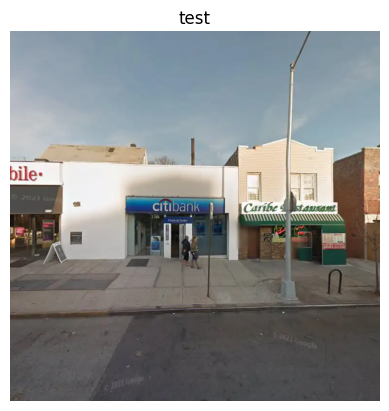

In [6]:
img_rgb = cv2.cvtColor(cv2.imread("/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m/0/u/b/0ubyzF6VwUL_w_BeRqDVhg_right.webp"), cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(img_rgb)
plt.axis('off')
plt.title("test")
plt.show()

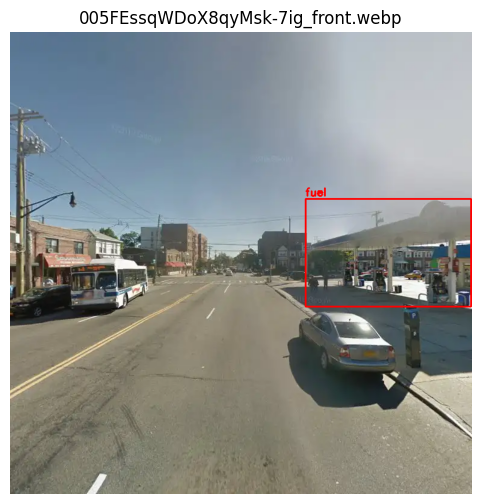

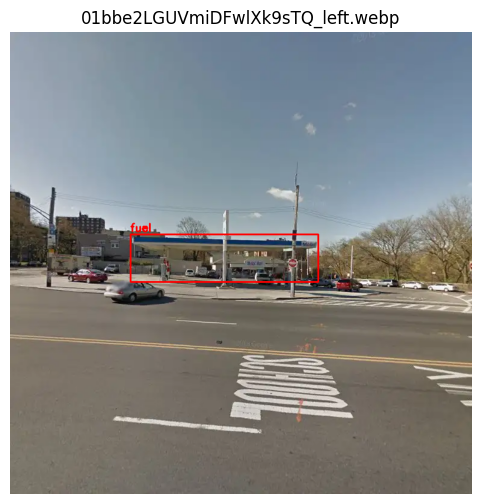

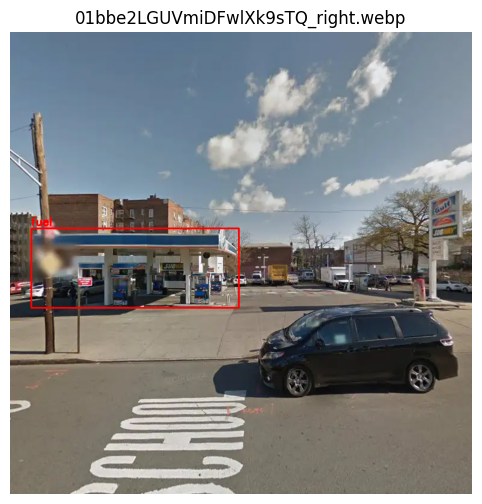

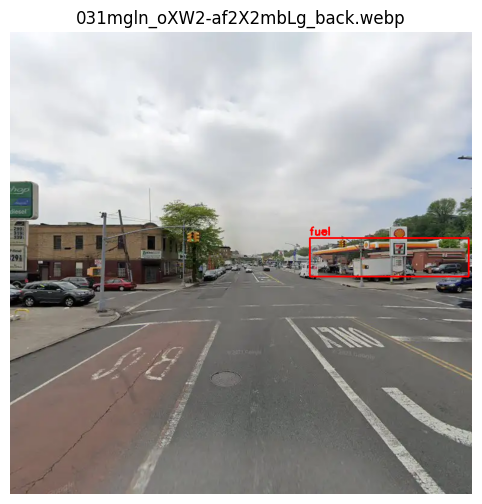

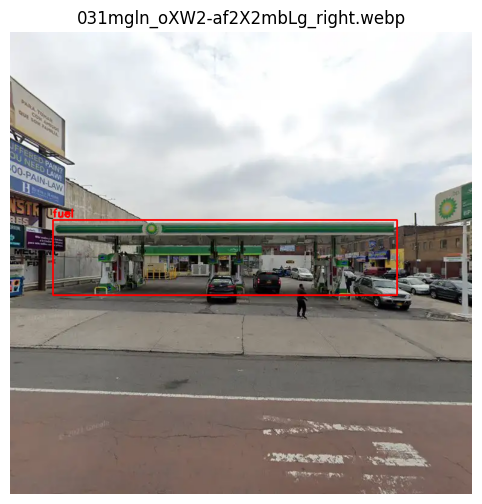

...

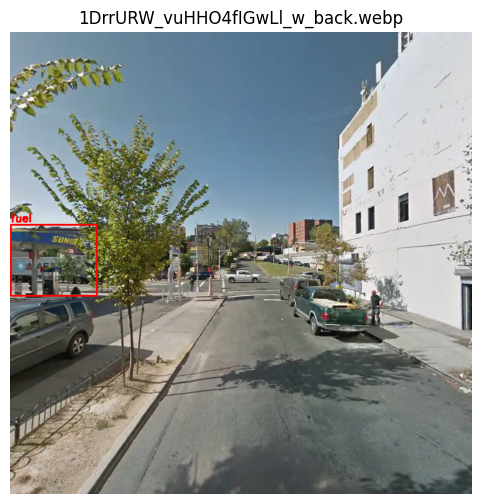

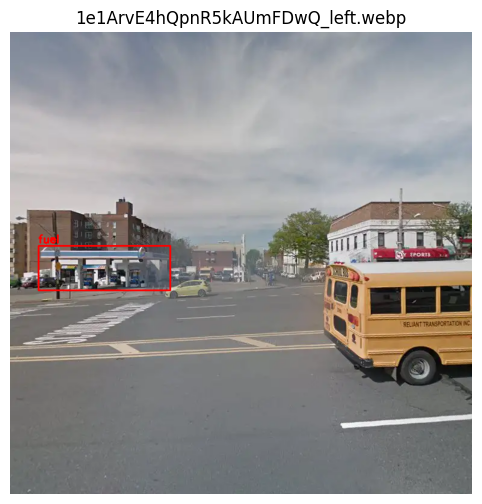

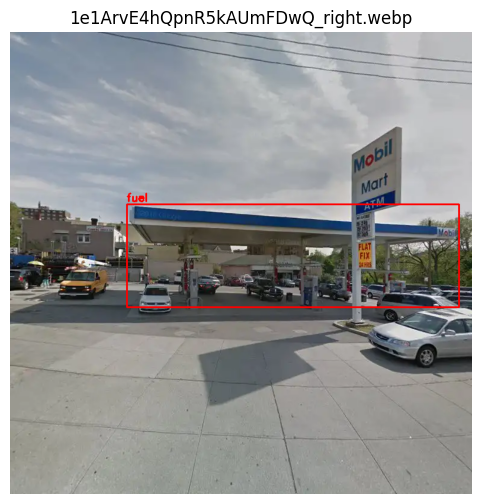

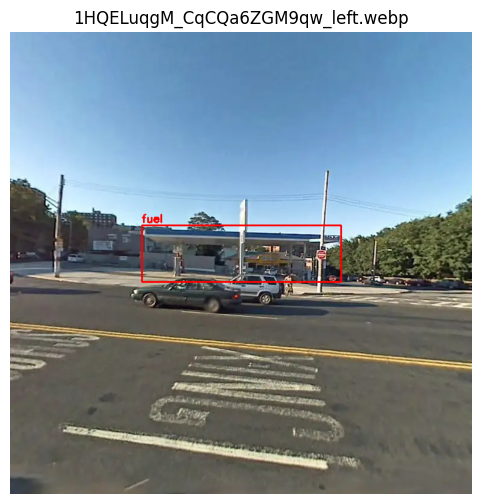

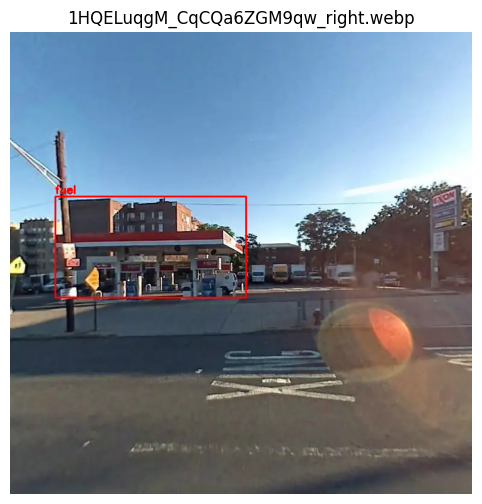

In [13]:
def plot_image_with_boxes(image_path, boxes, labels, output_size=(10, 6)):
    """
    Loads an image from `image_path`, draws bounding boxes and labels from `boxes` and `labels`,
    then displays it using matplotlib.
    
    :param image_path: path to the image file
    :param boxes: list of bounding boxes, each a tuple/list [x_min, y_min, x_max, y_max]
    :param labels: list of labels for each bounding box
    :param output_size: (width, height) figure size for matplotlib
    """
    
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"Could not load image from {image_path}")
        return
    
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    for (box, label) in zip(boxes, labels):
        x_min, y_min, x_max, y_max = box
        # Convert to integers
        x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)
        
        cv2.rectangle(img_rgb, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        # Put label text above the top-left corner of the box
        cv2.putText(
            img_rgb, 
            str(label), 
            (x_min, max(y_min - 5, 0)), 
            cv2.FONT_HERSHEY_SIMPLEX, 
            0.6, 
            (255, 0, 0), 
            2
        )
    
    plt.figure(figsize=output_size)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(os.path.basename(image_path))
    plt.show()

base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"


def get_image_path(row):
    image_id = row['id']
    subfolder = row['subfolder']
    orientation = row['orientation']
    return os.path.join(base_folder, subfolder, f"{image_id}_{orientation}.webp")

filtered_df['image_path'] = filtered_df.apply(get_image_path, axis=1)

grouped = filtered_df.groupby('image_path')
# get first 30 or so
unique_paths = filtered_df['image_path'].unique()[:30]

for path in unique_paths:
    rows_for_this_image = grouped.get_group(path)
    
    boxes = rows_for_this_image[['x_min','y_min','x_max','y_max']].values.tolist()
    labels = rows_for_this_image['label'].tolist()
    
    plot_image_with_boxes(path, boxes, labels)


In [5]:
detection_df_filtered = filtered_df

In [10]:
base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"

def get_image_path(row):
    image_id = row['id']
    subfolder = row['subfolder']
    orientation = row['orientation']
    return os.path.join(base_folder, subfolder, f"{image_id}_{orientation}.webp")

def row_to_conversation(row, amenities_map):
    """
    Convert a single row from detection_df_filtered into the desired JSON format.

    Args:
        row (pd.Series): A single row from the DataFrame.
        amenities_map (dict): Map from original amenity label to a nice name.

    Returns:
        dict: JSON-style dictionary ready to be appended to the final dataset list.
    """
    original_label = row["label"]
    mapped_label = amenities_map.get(original_label, original_label)

    distance = row["min_distance"]
    rounded_distance = int(round(distance))

    question = f"How far is the {mapped_label} away from the camera in meters, rounded to the next meter?"
    answer = f"{rounded_distance}"

    unique_id = row["id"] + "_" + row["orientation"]

    # Construct the JSON entry
    item = {
        "id": unique_id,
        "image": get_image_path(row),  # just the filename, or full path if you prefer
        "conversations": [
            {
                "from": "human",
                "value": "<image>" + question
            },
            {
                "from": "gpt",
                "value": answer
            }
        ]
    }
    return item

def split_and_save_detection_df(detection_df_filtered, output_folder, amenities_map,
                                test_size=0.2, val_size=0.1, random_state=42):
    """
    Split detection_df_filtered into train/val/test, generate LLaVA-style JSON for each row,
    and save as separate JSON files.

    Args:
        detection_df_filtered (pd.DataFrame): The DataFrame with columns:
            [id, subfolder, orientation, label, confidence, x_min, y_min, x_max, y_max,
             count_in_proximity, min_distance, image_path]
        output_folder (str): Where to write the final .json files (train.json, val.json, test.json).
        amenities_map (dict): Map for human-readable amenity names.
        test_size (float): Fraction of data to go into test.
        val_size (float): Fraction of data (remaining after test) to go into val.
        random_state (int): Random seed for reproducibility.
    """

    # 1) Make sure output folder exists
    os.makedirs(output_folder, exist_ok=True)

    # 2) Split into train/test first
    trainval_df, test_df = train_test_split(
        detection_df_filtered, 
        test_size=test_size, 
        random_state=random_state
    )

    # 3) Split trainval into train/val
    #    val_size is the fraction of the *original entire dataset* you want for val.
    #    We adjust it for the remainder (trainval_df).
    val_fraction_of_trainval = val_size / (1.0 - test_size)
    
    train_df, val_df = train_test_split(
        trainval_df, 
        test_size=val_fraction_of_trainval, 
        random_state=random_state
    )

    # 4) Convert each split into a list of JSON entries
    train_items = [row_to_conversation(row, amenities_map) for _, row in train_df.iterrows()]
    val_items   = [row_to_conversation(row, amenities_map) for _, row in val_df.iterrows()]
    test_items  = [row_to_conversation(row, amenities_map) for _, row in test_df.iterrows()]

    # 5) Save each list to a JSON file
    for split_name, items in [
        ("train", train_items),
        ("val",   val_items),
        ("test",  test_items),
    ]:
        json_path = os.path.join(output_folder, f"{split_name}.json")
        with open(json_path, "w", encoding="utf-8") as f:
            json.dump(items, f, indent=4)

    print(f"Saved train/val/test splits in: {output_folder}")
    print(f"   Train set: {len(train_items)} items")
    print(f"   Val   set: {len(val_items)} items")
    print(f"   Test  set: {len(test_items)} items")


# -----------------------------------
# Example usage:
# -----------------------------------

# Suppose your final detection results are in `detection_df_filtered`:
# columns -> [id, subfolder, orientation, label, confidence, x_min, y_min, x_max, y_max,
#             count_in_proximity, min_distance, image_path]

# output folder for the JSON files
output_folder = "dataset_new"

# Call the function
split_and_save_detection_df(
    detection_df_filtered=filtered_df,
    output_folder=output_folder,
    amenities_map=amenities_map,
    test_size=0.15,   # 20% test
    val_size=0.15,
    random_state=42
)

Saved train/val/test splits in: dataset_new
   Train set: 1366 items
   Val   set: 293 items
   Test  set: 293 items


In [11]:
import json